1. DATA LOAD

In [ ]:
# 1. 기존 폴더 완전히 삭제
!rm -rf /content/bdd100k_night
!rm -rf /content/bdd_night_test
!rm -rf /content/bdd_night_final

print("✅ 모든 데이터가 초기화되었습니다. 다시 압축을 풀어주세요.")

✅ 모든 데이터가 초기화되었습니다. 다시 압축을 풀어주세요.


In [ ]:
from google.colab import drive
import os

# 1. 구글 드라이브 마운트
drive.mount('/content/drive')

# 2. ZIP 파일 경로 설정 (본인의 실제 경로로 수정하세요)
zip_path = '/content/drive/MyDrive/bdd100k-finetune.v3-bdd100k-night-v3.coco.zip'
target_dir = '/content/bdd100k_night'

# 3. 압축 해제
if not os.path.exists(target_dir):
    os.makedirs(target_dir)
    !unzip -q "{zip_path}" -d "{target_dir}"
    print("압축 해제 완료!")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
압축 해제 완료!


2. DATASET 시각화

[TRAIN] 이미지: 27445장, 박스 개수: 361859개


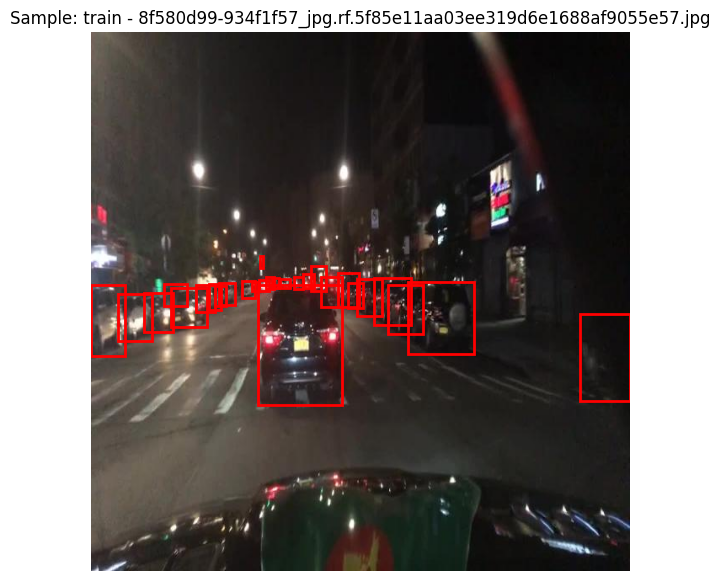

[VALID] 이미지: 4394장, 박스 개수: 58316개


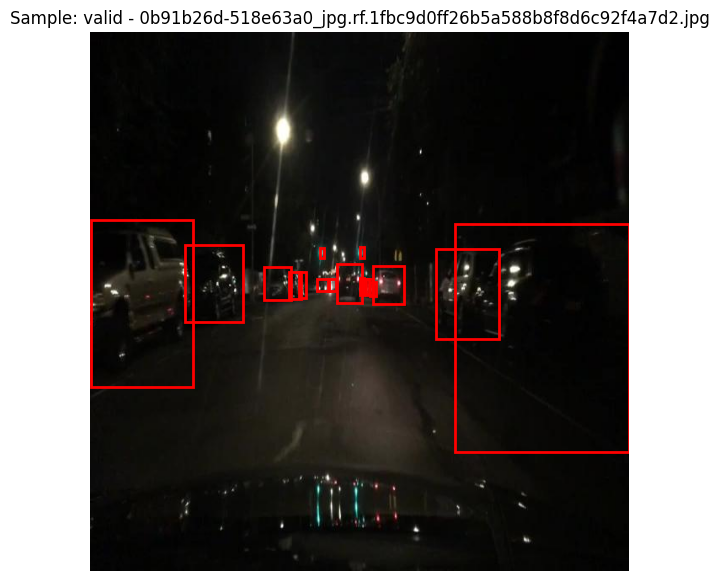

[TEST] 이미지: 60장, 박스 개수: 881개


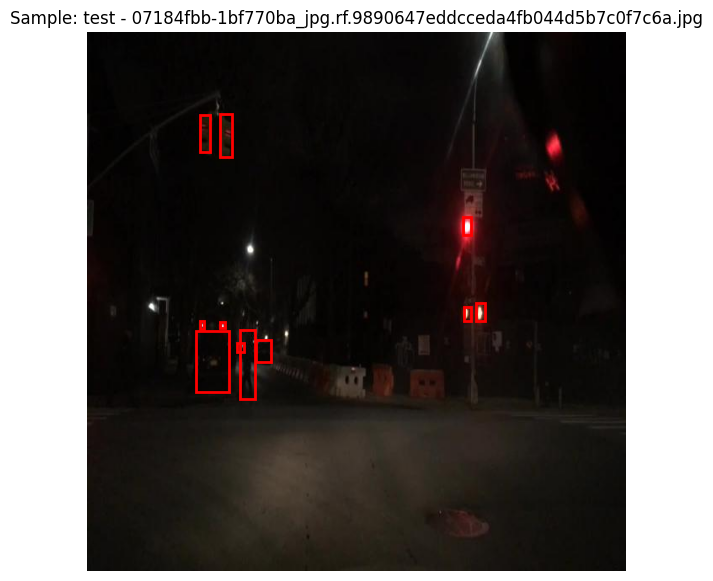

In [ ]:
import json
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import random

def check_and_visualize(base_path, split_name):
    # 1. 경로 설정 (폴더명이 valid인지 val인지 확인 필요)
    split_path = os.path.join(base_path, split_name)
    ann_path = os.path.join(split_path, "_annotations.coco.json")

    if not os.path.exists(ann_path):
        print(f"경로를 찾을 수 없습니다: {ann_path}")
        return

    # 2. JSON 데이터 로드
    with open(ann_path, 'r') as f:
        data = json.load(f)

    # 3. 이미지 개수 출력
    num_images = len(data['images'])
    num_anns = len(data['annotations'])
    print(f"[{split_name.upper()}] 이미지: {num_images}장, 박스 개수: {num_anns}개")

    # 4. 랜덤 샘플 시각화 (좌표 변환 없이 원본 그대로)
    sample_img_info = random.choice(data['images'])
    img_id = sample_img_info['id']
    img_name = sample_img_info['file_name']

    # 이미지 불러오기
    img_path = os.path.join(split_path, img_name)
    img = Image.open(img_path)

    plt.figure(figsize=(12, 7))
    plt.imshow(img)
    ax = plt.gca()

    # 해당 이미지의 박스(annotations)만 찾아서 그리기
    for ann in data['annotations']:
        if ann['image_id'] == img_id:
            # COCO 원본 좌표: [x_min, y_min, width, height]
            x, y, w, h = ann['bbox']

            # 박스 그리기 (변환 없이 원본 좌표 사용)
            rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

    plt.title(f"Sample: {split_name} - {img_name}")
    plt.axis('off')
    plt.show()

# --- 실행 부분 ---
root_path = '/content/bdd100k_night'

# 폴더명이 다를 수 있으니 리스트를 확인하세요
for s in ['train', 'valid', 'test']:
    check_and_visualize(root_path, s)

3. COCO-> YOLO 변환

In [ ]:
!pip install -q ultralytics
import os
import json
import shutil
from tqdm import tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 23.6 MB/s eta 0:00:00


In [ ]:
def convert_coco_to_yolo(base_path, split_name):
    split_path = os.path.join(base_path, split_name)
    json_path = os.path.join(split_path, "_annotations.coco.json")

    # 1. 새 구조 생성 (images, labels)
    new_img_dir = os.path.join(split_path, 'images_new')
    new_lbl_dir = os.path.join(split_path, 'labels')
    os.makedirs(new_img_dir, exist_ok=True)
    os.makedirs(new_lbl_dir, exist_ok=True)

    with open(json_path, 'r') as f:
        data = json.load(f)

    # 카테고리 매핑 (ID가 0부터 시작하도록 조정)
    categories = {cat['id']: i for i, cat in enumerate(data['categories'])}

    # 이미지 정보 로드
    images = {img['id']: img for img in data['images']}

    # 2. 어노테이션 변환
    for ann in tqdm(data['annotations'], desc=f"Converting {split_name}"):
        img_info = images[ann['image_id']]
        img_w, img_h = img_info['width'], img_info['height']
        img_name = img_info['file_name']

        # YOLO 좌표 계산 (Normalized center_x, center_y, width, height)
        x, y, w, h = ann['bbox']
        cx = (x + w / 2) / img_w
        cy = (y + h / 2) / img_h
        nw = w / img_w
        nh = h / img_h

        cls_id = categories[ann['category_id']]

        # 텍스트 파일 저장
        txt_name = os.path.splitext(img_name)[0] + ".txt"
        with open(os.path.join(new_lbl_dir, txt_name), 'a') as f:
            f.write(f"{cls_id} {cx:.6f} {cy:.6f} {nw:.6f} {nh:.6f}\n")

    # 3. 이미지 이동 및 정리
    for img_id in images:
        img_name = images[img_id]['file_name']
        old_path = os.path.join(split_path, img_name)
        new_path = os.path.join(new_img_dir, img_name)
        if os.path.exists(old_path):
            shutil.move(old_path, new_path)

    # 기존 폴더 교체 (깔끔한 구조 유지)
    # 기존에 이미지가 있던 자리를 'images' 폴더로 변경
    os.rename(new_img_dir, os.path.join(split_path, 'images'))
    print(f"\n{split_name} 변환 완료!")

# 실행
root_path = '/content/bdd100k_night'
for s in ['train', 'valid', 'test']:
    convert_coco_to_yolo(root_path, s)

Converting train: 100%|██████████| 361859/361859 [00:09<00:00, 39614.43it/s]



train 변환 완료!


Converting valid: 100%|██████████| 58316/58316 [00:01<00:00, 40401.78it/s]



valid 변환 완료!


Converting test: 100%|██████████| 881/881 [00:00<00:00, 40142.33it/s]


test 변환 완료!


In [ ]:
import os

def check_dataset_counts(base_path):
    # 확인할 데이터셋 스플릿 리스트 (폴더 구조에 맞게 수정)
    splits = ['train', 'valid', 'test']

    print(f"{'Split':<10} | {'Images':<10} | {'Labels':<10} | {'Status'}")
    print("-" * 50)

    for split in splits:
        split_path = os.path.join(base_path, split)

        # 폴더 존재 확인
        if not os.path.exists(split_path):
            continue

        img_path = os.path.join(split_path, 'images')
        lbl_path = os.path.join(split_path, 'labels')

        # 이미지와 라벨 파일 리스트 추출 (확장자 필터링)
        images = [f for f in os.listdir(img_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))] if os.path.exists(img_path) else []
        labels = [f for f in os.listdir(lbl_path) if f.lower().endswith('.txt')] if os.path.exists(lbl_path) else []

        # 정합성 확인 (이미지 개수와 라벨 개수가 맞는지)
        status = "✅ OK" if len(images) == len(labels) and len(images) > 0 else "❌ Mismatch or Empty"

        print(f"{split:<10} | {len(images):<10} | {len(labels):<10} | {status}")

# 실행
root_path = '/content/bdd100k_night'
check_dataset_counts(root_path)

Split      | Images     | Labels     | Status
--------------------------------------------------
train      | 27445      | 27326      | ❌ Mismatch or Empty
valid      | 4394       | 4373       | ❌ Mismatch or Empty
test       | 60         | 60         | ✅ OK


In [ ]:
import os

# 경로 설정
base_path = '/content/bdd100k_night'
label_dirs = ['train/labels', 'valid/labels', 'test/labels']

# 매핑 규칙 (전달해주신 딕셔너리 기준)
# Vehicle (0): bike(11), bus(12), car(13), motor(14), train(21), truck(22)
# Pedestrian (1): person(15), rider(16)
vehicle_ids = [11, 12, 13, 14, 21, 22]
pedestrian_ids = [15, 16]

print("🚀 클래스 ID 변환 시작 (13 -> 0 등)...")

for dtype in label_dirs:
    target_dir = os.path.join(base_path, dtype)
    if not os.path.exists(target_dir): continue

    for label_file in os.listdir(target_dir):
        if not label_file.endswith('.txt'): continue

        file_path = os.path.join(target_dir, label_file)
        new_lines = []

        with open(file_path, 'r') as f:
            for line in f:
                parts = line.split()
                if not parts: continue

                old_id = int(parts[0])
                if old_id in vehicle_ids:
                    new_id = 0  # Vehicle
                elif old_id in pedestrian_ids:
                    new_id = 1  # Pedestrian
                else:
                    continue # 17(신호등) 등 나머지는 무시

                new_lines.append(f"{new_id} {' '.join(parts[1:])}\n")

        # 수정된 내용 덮어쓰기
        with open(file_path, 'w') as f:
            f.writelines(new_lines)

print("✅ 모든 라벨의 숫자가 0 또는 1로 바뀌었습니다!")

🚀 클래스 ID 변환 시작 (13 -> 0 등)...
✅ 모든 라벨의 숫자가 0 또는 1로 바뀌었습니다!


In [ ]:
import os
import yaml

# 1. 경로 설정
dataset_path = '/content/bdd100k_night'
label_dirs = ['labels/train', 'labels/valid', 'labels/test']

# 2. 사용자님 요청 기반 매핑 (ID 기준)
# Vehicle (0): bike(11), bus(12), car(13), motor(14), truck(22)
# Pedestrian (1): person(15), rider(16)
# ※ 21번(train)은 제외됩니다.
vehicle_ids = [11, 12, 13, 14, 22]
pedestrian_ids = [15, 16]

print("🚀 사용자 정의 매핑 시작 (기차 제외, Vehicle/Pedestrian 통합)...")

for dtype in label_dirs:
    target_dir = os.path.join(dataset_path, dtype)
    if not os.path.exists(target_dir): continue

    for label_file in os.listdir(target_dir):
        if not label_file.endswith('.txt'): continue

        file_path = os.path.join(target_dir, label_file)
        new_lines = []

        with open(file_path, 'r') as f:
            for line in f:
                parts = line.split()
                if not parts: continue

                class_id = int(parts[0])

                # --- 매핑 로직 ---
                if class_id in vehicle_ids:
                    new_id = 0
                elif class_id in pedestrian_ids:
                    new_id = 1
                else:
                    # 기차(21), 신호등 등은 여기서 걸러집니다.
                    continue

                new_lines.append(f"{new_id} {' '.join(parts[1:])}\n")

        with open(file_path, 'w') as f:
            f.writelines(new_lines)

print("✅ 라벨 수정 완료! (기차 제외됨)")

# 3. data.yaml 생성
data_config = {
    'path': dataset_path,
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'nc': 2,
    'names': ['Vehicle', 'Pedestrian']
}

with open(os.path.join(dataset_path, 'data.yaml'), 'w') as f:
    yaml.dump(data_config, f, sort_keys=False)

print("✅ data.yaml 업데이트 완료!")

🚀 사용자 정의 매핑 시작 (기차 제외, Vehicle/Pedestrian 통합)...
✅ 라벨 수정 완료! (기차 제외됨)
✅ data.yaml 업데이트 완료!


In [ ]:
import os
from ultralytics import YOLO

# 1. P2 레이어가 추가된 YOLOv11s 설계도(YAML) 생성
p2_model_config = """
nc: 2
scales:
  s: [0.50, 0.50, 1024]

backbone:
  - [-1, 1, Conv, [64, 3, 2]]      # 0-P1/2
  - [-1, 1, Conv, [128, 3, 2]]     # 1-P2/4
  - [-1, 2, C3k2, [256, False, 0.25]]
  - [-1, 1, Conv, [256, 3, 2]]     # 3-P3/8
  - [-1, 2, C3k2, [512, False, 0.25]]
  - [-1, 1, Conv, [512, 3, 2]]     # 5-P4/16
  - [-1, 2, C3k2, [512, True, 0.25]]
  - [-1, 1, Conv, [1024, 3, 2]]    # 7-P5/32
  - [-1, 2, C3k2, [1024, True, 0.25]]
  - [-1, 1, SPPF, [1024, 5]]       # 9
  - [-1, 2, C2PSA, [1024]]         # 10

head:
  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 6], 1, Concat, [1]]      # cat backbone P4
  - [-1, 2, C3k2, [512, False]]    # 13

  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 4], 1, Concat, [1]]      # cat backbone P3
  - [-1, 2, C3k2, [256, False]]    # 16

  - [-1, 1, nn.Upsample, [None, 2, 'nearest']]
  - [[-1, 2], 1, Concat, [1]]      # cat backbone P2 (stride 4)
  - [-1, 2, C3k2, [128, False]]    # 19

  - [-1, 1, Conv, [128, 3, 2]]
  - [[-1, 16], 1, Concat, [1]]     # cat head P3
  - [-1, 2, C3k2, [256, False]]    # 22

  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 13], 1, Concat, [1]]     # cat head P4
  - [-1, 2, C3k2, [512, False]]    # 25

  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 10], 1, Concat, [1]]     # cat head P5
  - [-1, 2, C3k2, [1024, True]]    # 28

  - [[19, 22, 25, 28], 1, Detect, [nc]] # P2, P3, P4, P5 출력
"""

yaml_path = 'yolo11s-p2.yaml'
with open(yaml_path, 'w') as f:
    f.write(p2_model_config.strip())
print(f"✅ {yaml_path} 파일이 현재 디렉토리에 생성되었습니다.")

# 2. 사전 학습된 가중치 준비 (yolo11s.pt)
weights_name = 'yolo11s.pt'
if not os.path.exists(weights_name):
    print(f"🔍 {weights_name} 다운로드 중...")
    YOLO(weights_name) # 자동 다운로드 유도

# 3. 모델 객체 생성 및 가중치 로드
model = YOLO(yaml_path).load(weights_name)

print("🚀 P2 레이어가 포함된 YOLOv11s 모델 준비 완료!")
# 모델 구조를 확인하고 싶다면 아래 주석을 해제하세요.
# model.info()

✅ yolo11s-p2.yaml 파일이 현재 디렉토리에 생성되었습니다.
🔍 yolo11s.pt 다운로드 중...
Transferred 215/593 items from pretrained weights
🚀 P2 레이어가 포함된 YOLOv11s 모델 준비 완료!


5. MODEL 학습

In [ ]:
# 모든 하위 디렉토리를 탐색하여 .cache 파일을 찾아 삭제
!find /content/bdd100k_night -name "*.cache" -delete

# 삭제가 잘 되었는지 확인 (아무것도 출력되지 않으면 성공)
!find /content/bdd100k_night -name "*.cache"

In [ ]:
import yaml
import os
from ultralytics import YOLO

# 1. data.yaml 업데이트
data_config = {
    'path': '/content/bdd100k_night',
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'nc': 2,
    'names': ['Vehicle', 'Pedestrian']
}

# 경로가 존재하는지 확인 후 저장
os.makedirs('/content/bdd100k_night', exist_ok=True)
with open('/content/bdd100k_night/data.yaml', 'w') as f:
    yaml.dump(data_config, f, sort_keys=False)

# 2. 가중치 파일명 수정 및 다운로드 체크
# YOLO11의 공식 이름은 'yolo11s.pt'입니다.
weights_path = 'yolo11s.pt'

if not os.path.exists(weights_path):
    print(f"🔍 {weights_path}가 없어 다운로드를 먼저 진행합니다.")
    YOLO(weights_path) # 파일이 없으면 자동으로 다운로드함

# 3. 모델 로드 (설계도 + 가중치 이식)
model = YOLO('yolo11s-p2.yaml').load(weights_path)

# 4. 학습 시작
model.train(
    data='/content/bdd100k_night/data.yaml',
    epochs=20,
    imgsz=640,
    batch=32,
    device=0,
    optimizer='AdamW',
    project='/content/drive/MyDrive/YOLOv11_Night',
    name='bdd100k_p2_final',
    exist_ok=True,
    cache=False,
    workers=2,
    verbose=True
)

Transferred 215/593 items from pretrained weights
Ultralytics 8.3.252 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/bdd100k_night/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s-p2.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=bdd100k_p2_final, nbs=64, nms=False, opset=None, optimize=False, optim

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d991b61eab0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

6. 학습 결과 확인

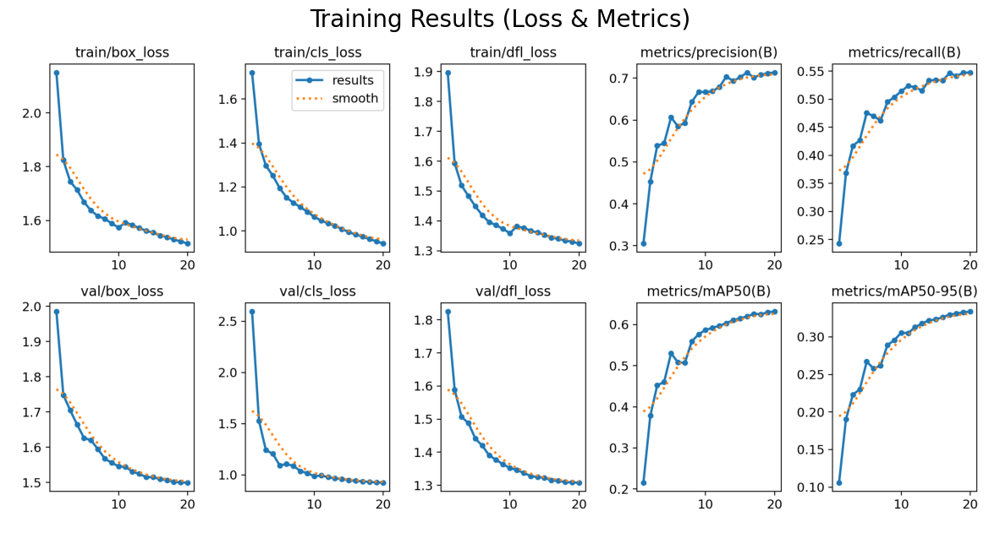

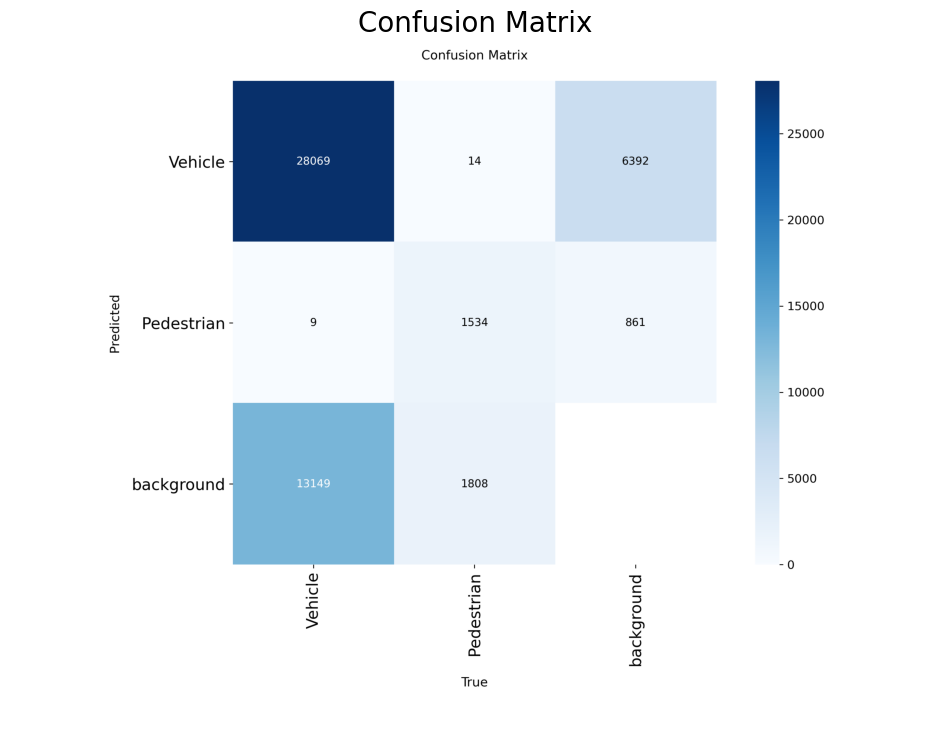


🔍 실제 예측 결과 비교 (Labels: 정답 / Pred: 모델의 예측)


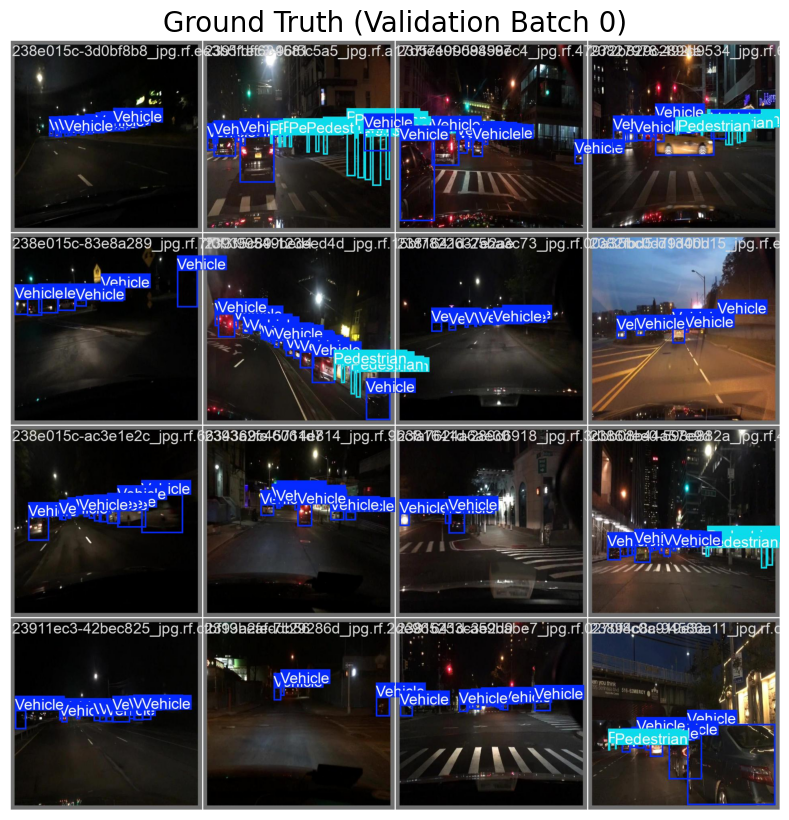

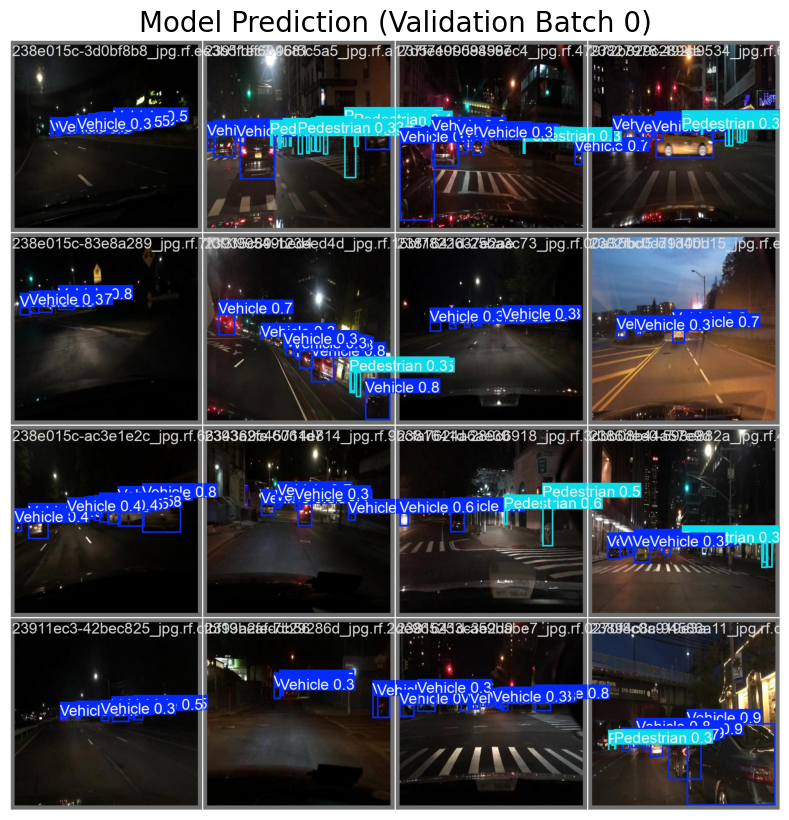

⚠️ 'F1_curve.png' 파일을 찾을 수 없습니다.
   현재 확인 중인 경로: /content/drive/MyDrive/YOLOv11_Night/bdd100k_p2_final/F1_curve.png
   팁: 구글 드라이브 동기화 시간이 걸릴 수 있으니 잠시 후 다시 실행해보세요.
⚠️ 'PR_curve.png' 파일을 찾을 수 없습니다.
   현재 확인 중인 경로: /content/drive/MyDrive/YOLOv11_Night/bdd100k_p2_final/PR_curve.png
   팁: 구글 드라이브 동기화 시간이 걸릴 수 있으니 잠시 후 다시 실행해보세요.


In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

# 1. 경로 설정: 앞선 학습 코드의 project + name을 정확히 결합합니다.
# project='/content/drive/MyDrive/YOLOv11_Night', name='bdd100k_p2_final'
result_dir = '/content/drive/MyDrive/YOLOv11_Night/bdd100k_p2_final'

def show_result_image(file_name, title, figsize=(15, 10)):
    img_path = os.path.join(result_dir, file_name)
    if os.path.exists(img_path):
        img = cv2.imread(img_path)
        plt.figure(figsize=figsize)
        # BGR을 RGB로 변환하여 출력
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title, fontsize=20)
        plt.axis('off')
        plt.show()
    else:
        print(f"⚠️ '{file_name}' 파일을 찾을 수 없습니다.")
        print(f"   현재 확인 중인 경로: {img_path}")
        print("   팁: 구글 드라이브 동기화 시간이 걸릴 수 있으니 잠시 후 다시 실행해보세요.")

# --- (1) 학습 결과 요약 (Loss & mAP) ---
show_result_image('results.png', 'Training Results (Loss & Metrics)')

# --- (2) 혼동 행렬 (Confusion Matrix) ---
# 어떤 객체를 가장 헷갈려하는지 확인 (예: 배경 vs 보행자)
show_result_image('confusion_matrix.png', 'Confusion Matrix', figsize=(12, 10))

# --- (3) 실제 예측 샘플 확인 ---
print("\n🔍 실제 예측 결과 비교 (Labels: 정답 / Pred: 모델의 예측)")
show_result_image('val_batch0_labels.jpg', 'Ground Truth (Validation Batch 0)')
show_result_image('val_batch0_pred.jpg', 'Model Prediction (Validation Batch 0)')

# --- (4) PR 및 F1 곡선 ---
show_result_image('F1_curve.png', 'F1-Confidence Curve', figsize=(10, 8))
show_result_image('PR_curve.png', 'Precision-Recall Curve', figsize=(10, 8))

best.pt로 test확인

In [ ]:
from ultralytics import YOLO
import os

# 1. 학습된 최적의 모델 불러오기
# 학습 시 project='/content/drive/MyDrive/YOLOv11_Night', name='bdd100k_p2_final'로 설정했으므로
# 실제 경로는 아래와 같이 생성됩니다.
best_model_path = '/content/drive/MyDrive/YOLOv11_Night/bdd100k_p2_final/weights/best.pt'

if os.path.exists(best_model_path):
    model = YOLO(best_model_path)
    print("✅ 최적의 가중치 모델을 성공적으로 불러왔습니다.")
else:
    print(f"❌ 모델 파일을 찾을 수 없습니다. 현재 시도 중인 경로: {best_model_path}")
    print("   팁: 구글 드라이브에 'weights' 폴더가 생성되었는지 확인해 보세요.")

# 2. Test 데이터셋으로 최종 평가
# split='test'를 통해 data.yaml에 설정된 test 경로의 데이터를 사용합니다.
metrics = model.val(
    data='/content/bdd100k_night/data.yaml',
    split='test',
    imgsz=640,
    batch=16,
    device=0
)

# 3. 주요 지표 출력
print("\n" + "🚀" + " [최종 테스트 결과 리포트] " + "="*20)
print(f"🔹 전체 mAP@50-95: {metrics.box.map:.4f} (정밀한 정확도)")
print(f"🔹 전체 mAP@50: {metrics.box.map50:.4f} (일반적인 정확도)")
print(f"🔹 정밀도(Precision): {metrics.box.mp:.4f}")
print(f"🔹 재현율(Recall): {metrics.box.mr:.4f}")
print("="*50)

# 4. 클래스별 상세 점수 출력
print("\n📊 [클래스별 mAP@50 상세 점수]")
# model.names는 {0: 'Vehicle', 1: 'Pedestrian'} 형태입니다.
for i, name in model.names.items():
    # metrics.box.maps[i]는 각 클래스별 mAP@50-95를 반환할 수 있으므로,
    # 구체적인 인덱싱으로 해당 클래스의 성능을 가져옵니다.
    cls_map = metrics.box.class_result(i)[2] # mAP@50 지표
    print(f" - {name.upper():<10}: {cls_map:.4f}")

✅ 최적의 가중치 모델을 성공적으로 불러왔습니다.
Ultralytics 8.3.252 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLO11s-p2 summary (fused): 120 layers, 8,473,048 parameters, 0 gradients, 27.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1045.9±264.8 MB/s, size: 28.5 KB)
val: Scanning /content/bdd100k_night/test/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60 18.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.8it/s 2.2s
                   all         60        649      0.748      0.523      0.651      0.344
               Vehicle         60        635      0.861      0.545      0.748      0.427
            Pedestrian          9         14      0.634        0.5      0.553       0.26
Speed: 3.6ms preprocess, 9.8ms inference, 0.0ms loss, 8.4ms postprocess per image
Results saved to /content/runs/detect/val2

🚀 [최종 테스트 결과 리포트] ====================
🔹 전체 mAP@50-95

Test 결과 시각화

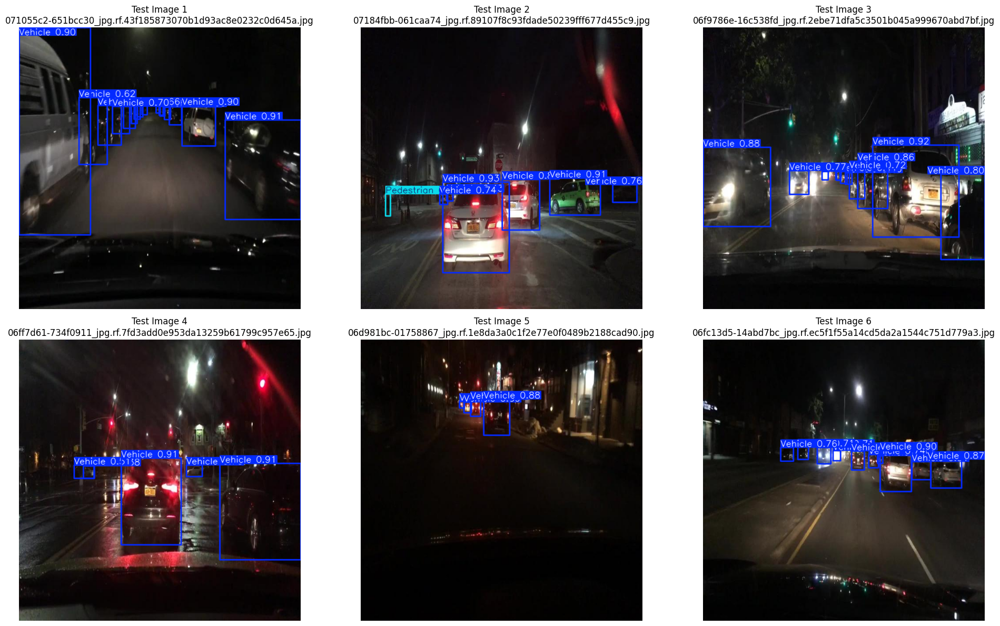

In [ ]:
import glob
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
import os

# 1. 최적의 모델 로드 (최종 실험 경로 반영)
best_model_path = '/content/drive/MyDrive/YOLOv11_Night/bdd100k_final_fix/weights/best.pt'

if not os.path.exists(best_model_path):
    print("❌ 모델 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
else:
    model = YOLO(best_model_path)

    # 2. 테스트 이미지 경로 설정 및 샘플링
    test_img_list = glob.glob('/content/bdd100k_night/test/images/*.jpg')

    if len(test_img_list) < 6:
        print(f"⚠️ 테스트 이미지가 부족합니다. 현재 개수: {len(test_img_list)}")
        num_samples = len(test_img_list)
    else:
        num_samples = 6

    # 6장을 무작위로 샘플링
    sample_images = random.sample(test_img_list, num_samples)

    # 3. 시각화 설정
    plt.figure(figsize=(20, 12))

    for i, img_path in enumerate(sample_images):
        # 모델 추론 (conf: 임계값, imgsz: 입력 크기)
        results = model.predict(source=img_path, conf=0.3, imgsz=640, verbose=False)

        # 결과 시각화 (Bounding Box와 Label이 그려진 이미지 생성)
        # line_width: 박스 두께, font_size: 글자 크기 조절 가능
        res_plotted = results[0].plot(line_width=2, font_size=1)

        # Matplotlib 출력 설정
        plt.subplot(2, 3, i + 1)
        plt.imshow(cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB))
        plt.title(f"Test Image {i+1}\n{os.path.basename(img_path)}", fontsize=12)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

🎲 테스트 데이터 중 3장을 무작위로 선택했습니다.


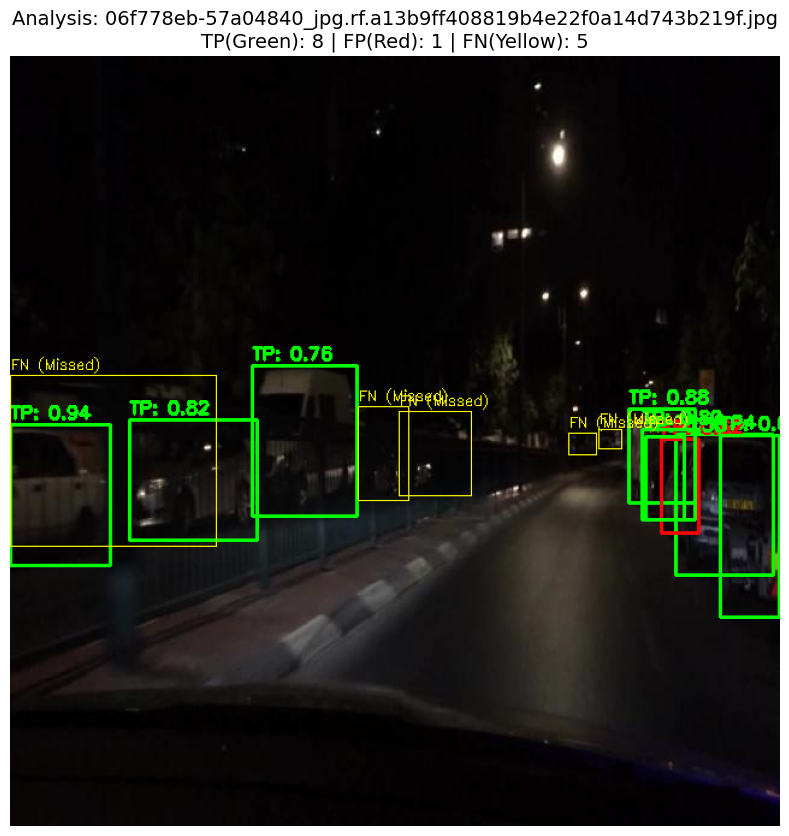

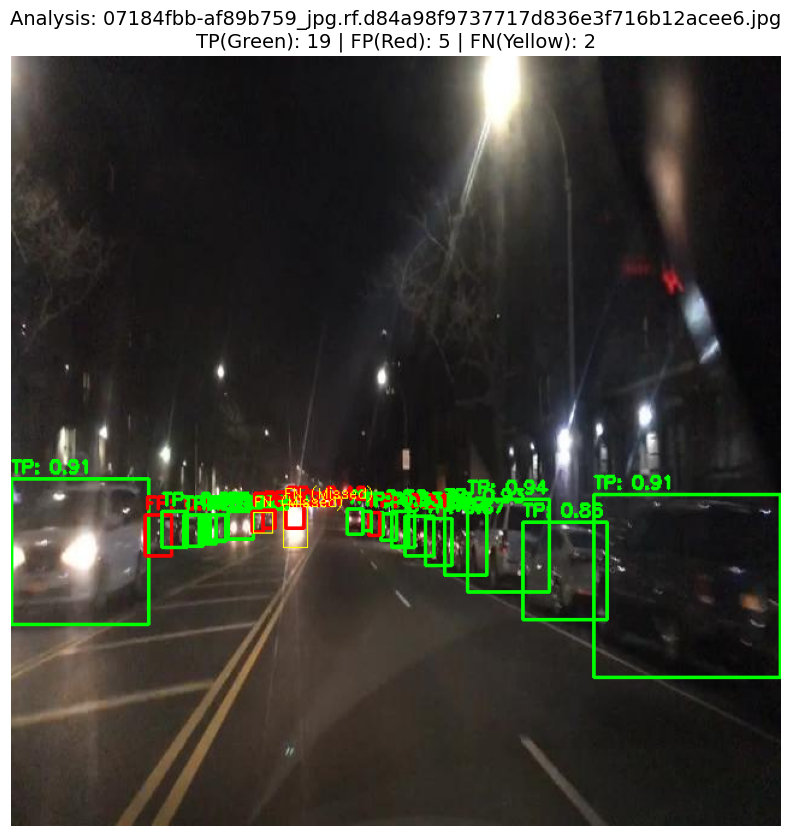

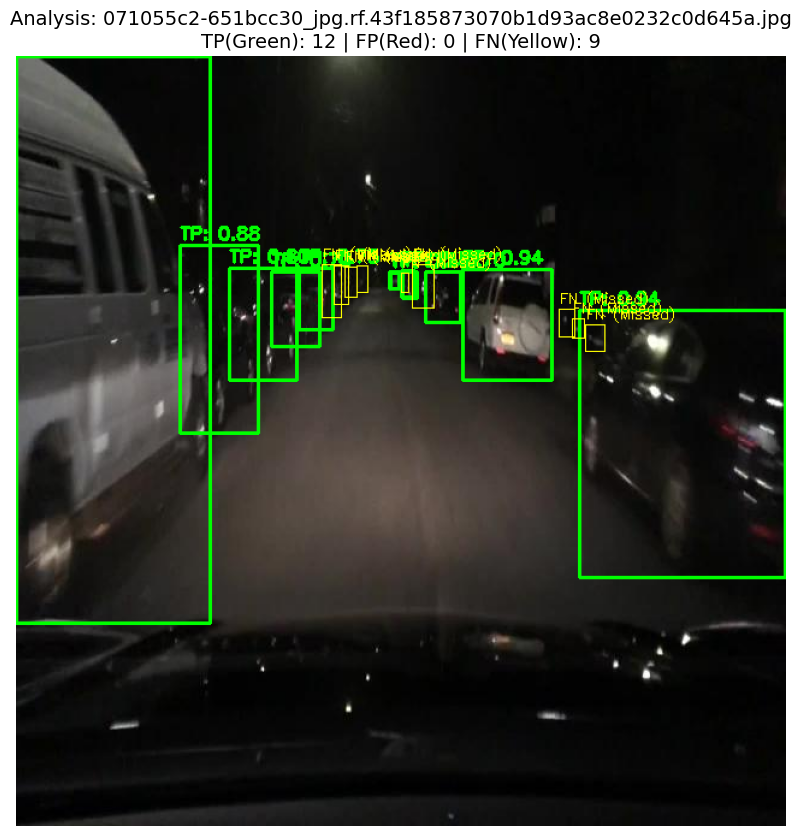

In [ ]:
import os
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import random  # 랜덤 라이브러리 추가
from ultralytics import YOLO

def calculate_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection
    return intersection / union if union > 0 else 0

# 1. 설정 및 경로
model_path = '/content/drive/MyDrive/YOLOv11_Night/bdd100k_p2_final/weights/best.pt'
img_dir = '/content/bdd100k_night/test/images'
label_dir = '/content/bdd100k_night/test/labels'
iou_threshold = 0.45

if not os.path.exists(model_path):
    print(f"❌ 모델 파일을 찾을 수 없습니다: {model_path}")
else:
    model = YOLO(model_path)
    test_images = glob.glob(os.path.join(img_dir, "*.jpg"))

    # --- 랜덤 샘플링 부분 수정 ---
    num_samples = 3  # 분석할 이미지 개수
    if len(test_images) >= num_samples:
        selected_images = random.sample(test_images, num_samples)
        print(f"🎲 테스트 데이터 중 {num_samples}장을 무작위로 선택했습니다.")
    else:
        selected_images = test_images
        print(f"⚠️ 테스트 이미지가 부족하여 {len(test_images)}장 전체를 분석합니다.")
    # ----------------------------

    # 2. 분석 실행
    for img_path in selected_images:
        img = cv2.imread(img_path)
        h, w, _ = img.shape
        img_res = img.copy()

        label_path = os.path.join(label_dir, os.path.basename(img_path).replace('.jpg', '.txt'))
        gt_boxes = []
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.split()
                    if len(parts) < 5: continue
                    _, cx, cy, nw, nh = map(float, parts)
                    gt_boxes.append([(cx-nw/2)*w, (cy-nh/2)*h, (cx+nw/2)*w, (cy+nh/2)*h])

        results = model.predict(img_path, conf=0.25, verbose=False)[0]

        matched_gt = set()
        tp_count, fp_count = 0, 0

        for pred in results.boxes:
            p_box = pred.xyxy[0].cpu().numpy()
            p_conf = float(pred.conf[0])

            ious = [calculate_iou(p_box, gt) for gt in gt_boxes]
            max_iou = max(ious) if ious else 0
            max_idx = np.argmax(ious) if ious else -1

            if max_iou >= iou_threshold:
                color = (0, 255, 0) # TP: 초록
                label = f"TP: {max_iou:.2f}"
                matched_gt.add(max_idx)
                tp_count += 1
            else:
                color = (0, 0, 255) # FP: 빨강
                label = f"FP: {p_conf:.2f}"
                fp_count += 1

            cv2.rectangle(img_res, (int(p_box[0]), int(p_box[1])), (int(p_box[2]), int(p_box[3])), color, 2)
            cv2.putText(img_res, label, (int(p_box[0]), int(p_box[1]-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

        fn_count = 0
        for i, gt in enumerate(gt_boxes):
            if i not in matched_gt:
                cv2.rectangle(img_res, (int(gt[0]), int(gt[1])), (int(gt[2]), int(gt[3])), (0, 255, 255), 1)
                cv2.putText(img_res, "FN (Missed)", (int(gt[0]), int(gt[1]-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 255), 1)
                fn_count += 1

        plt.figure(figsize=(15, 10))
        plt.imshow(cv2.cvtColor(img_res, cv2.COLOR_BGR2RGB))
        plt.title(f"Analysis: {os.path.basename(img_path)}\nTP(Green): {tp_count} | FP(Red): {fp_count} | FN(Yellow): {fn_count}", fontsize=14)
        plt.axis('off')
        plt.show()

✅ 10장의 이미지에 정답(GT) 박스를 그렸습니다.


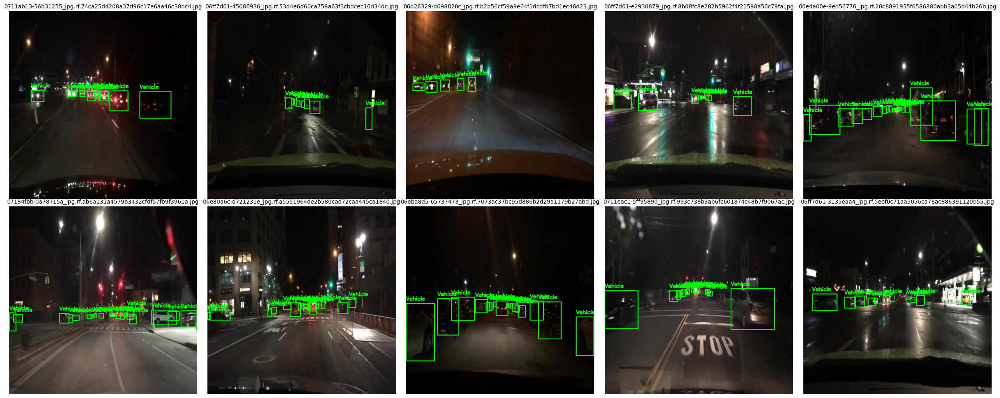

In [ ]:
import os
import cv2
import glob
import random
import matplotlib.pyplot as plt

# 1. 경로 설정
img_dir = '/content/bdd100k_night/test/images'
label_dir = '/content/bdd100k_night/test/labels'
class_names = ['Vehicle', 'Pedestrian']  # 클래스 이름 (data.yaml 기준)
colors = [(0, 255, 0), (255, 255, 0)]    # Vehicle: 초록색, Pedestrian: 노란색

# 2. 테스트 이미지 리스트 확보 및 10장 랜덤 샘플링
test_images = glob.glob(os.path.join(img_dir, "*.jpg"))
num_samples = 10

if len(test_images) < num_samples:
    num_samples = len(test_images)

selected_images = random.sample(test_images, num_samples)

# 3. 시각화 설정 (2행 5열)
plt.figure(figsize=(25, 10))

for i, img_path in enumerate(selected_images):
    # 이미지 읽기
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # 대응하는 라벨 파일 경로 찾기 (.jpg -> .txt)
    label_path = os.path.join(label_dir, os.path.basename(img_path).replace('.jpg', '.txt'))

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                # YOLO 포맷: class_id cx cy nw nh (0~1 사이값)
                parts = line.split()
                if len(parts) < 5: continue

                cls_id = int(parts[0])
                cx, cy, nw, nh = map(float, parts[1:])

                # 정규화된 좌표를 픽셀 좌표로 변환
                x1 = int((cx - nw/2) * w)
                y1 = int((cy - nh/2) * h)
                x2 = int((cx + nw/2) * w)
                y2 = int((cy + nh/2) * h)

                # 박스 그리기
                color = colors[cls_id] if cls_id < len(colors) else (255, 255, 255)
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

                # 클래스 이름 표시
                label_text = class_names[cls_id] if cls_id < len(class_names) else f"ID:{cls_id}"
                cv2.putText(img, label_text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                            0.6, color, 2)

    # 마플립 서브플롯 배치
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(os.path.basename(img_path), fontsize=10)
    plt.axis('off')

print(f"✅ {num_samples}장의 이미지에 정답(GT) 박스를 그렸습니다.")
plt.tight_layout()
plt.show()

파일명                            | 정답(GT) 개수  | 예측(Pred) 개수
------------------------------------------------------------
07184fbb-33a15da2_jpg.rf.46cc8455a30a3fb3693f7b4674ba43b1.jpg | 10            | 11           
06d57927-5a416759_jpg.rf.06bde7ff93b4a104b9b7a9421ba94d7f.jpg | 3             | 2            
06ff7d61-48a6bc46_jpg.rf.c0b48ff9853cd3eaf755c7b381aec94d.jpg | 15            | 15           
06e4a00e-346390c8_jpg.rf.01398e7c68653867aaa8a58ecfc1141f.jpg | 3             | 3            
06eba8d5-f4b1dde6_jpg.rf.18b68a69d86fad134640a7ff318ff5ed.jpg | 6             | 7            
06cb522f-f1ff4334_jpg.rf.9a5f554bf24dc24f82549c0141f5692e.jpg | 13            | 13           
071055c2-651bcc30_jpg.rf.43f185873070b1d93ac8e0232c0d645a.jpg | 19            | 12           
06ff7d61-734f0911_jpg.rf.7fd3add0e953da13259b61799c957e65.jpg | 5             | 5            
07184fbb-0a78715a_jpg.rf.ab6a131a4579b3432cfdf57fb9f3961a.jpg | 19            | 18           
06e78685-b80ce1cc_jpg.rf.9cee63a2c6

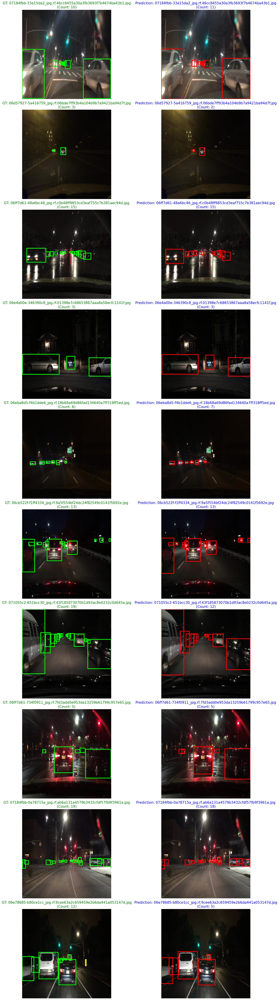

In [ ]:
import os
import cv2
import glob
import random
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 1. 설정 및 모델 로드
model_path = '/content/drive/MyDrive/YOLOv11_Night/bdd100k_p2_final/weights/best.pt'
img_dir = '/content/bdd100k_night/test/images'
label_dir = '/content/bdd100k_night/test/labels'
class_names = ['Vehicle', 'Pedestrian']
colors = [(0, 255, 0), (255, 255, 0)] # GT 색상 (초록, 노랑)

if not os.path.exists(model_path):
    print("❌ 모델 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
else:
    model = YOLO(model_path)
    test_images = glob.glob(os.path.join(img_dir, "*.jpg"))
    selected_images = random.sample(test_images, 10)

    # 시각화 설정 (10행 2열)
    fig, axes = plt.subplots(10, 2, figsize=(20, 60))

    print(f"{'파일명':<30} | {'정답(GT) 개수':<10} | {'예측(Pred) 개수':<10}")
    print("-" * 60)

    for i, img_path in enumerate(selected_images):
        img_basename = os.path.basename(img_path)
        img_orig = cv2.imread(img_path)
        img_orig = cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB)
        h, w, _ = img_orig.shape

        # --- [A] GT 박스 처리 및 개수 세기 ---
        img_gt = img_orig.copy()
        gt_count = 0
        label_path = os.path.join(label_dir, img_basename.replace('.jpg', '.txt'))

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                gt_count = len(lines) # 라벨 파일의 줄 수가 곧 박스 개수
                for line in lines:
                    parts = line.split()
                    if len(parts) < 5: continue
                    cls_id = int(parts[0])
                    cx, cy, nw, nh = map(float, parts[1:])
                    x1, y1 = int((cx - nw/2) * w), int((cy - nh/2) * h)
                    x2, y2 = int((cx + nw/2) * w), int((cy + nh/2) * h)
                    cv2.rectangle(img_gt, (x1, y1), (x2, y2), colors[cls_id], 3)

        # --- [B] 예측 박스 처리 및 개수 세기 ---
        results = model.predict(img_path, conf=0.25, verbose=False)[0]
        img_pred = img_orig.copy()
        pred_count = len(results.boxes) # 예측된 박스 개수

        for box in results.boxes:
            b = box.xyxy[0].cpu().numpy()
            c = int(box.cls)
            conf = float(box.conf)
            cv2.rectangle(img_pred, (int(b[0]), int(b[1])), (int(b[2]), int(b[3])), (255, 0, 0), 3)

        # 터미널에 텍스트 결과 출력
        print(f"{img_basename:<30} | {gt_count:<13} | {pred_count:<13}")

        # 그래프 제목에 개수 표시
        axes[i, 0].imshow(img_gt)
        axes[i, 0].set_title(f"GT: {img_basename}\n(Count: {gt_count})", fontsize=15, color='green')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(img_pred)
        axes[i, 1].set_title(f"Prediction: {img_basename}\n(Count: {pred_count})", fontsize=15, color='blue')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
import os
import glob
import random
from ultralytics import YOLO

# 1. 경로 설정
model_path = '/content/drive/MyDrive/YOLOv11_Night/bdd100k_p2_final/weights/best.pt'
img_dir = '/content/bdd100k_night/test/images'
label_dir = '/content/bdd100k_night/test/labels'

# 2. 모델 로드 및 이미지 샘플링
if not os.path.exists(model_path):
    print("❌ 모델 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
else:
    model = YOLO(model_path)
    test_images = glob.glob(os.path.join(img_dir, "*.jpg"))

    # 60장 샘플링 (이미지가 60장보다 적으면 전체 선택)
    num_samples = min(60, len(test_images))
    selected_images = random.sample(test_images, num_samples)

    # 결과를 저장할 리스트
    results_list = []
    total_gt = 0
    total_pred = 0

    print(f"🚀 {num_samples}장의 이미지에 대해 분석을 시작합니다. (Conf=0.25)")
    print("-" * 65)
    print(f"{'번호':<4} | {'파일명':<30} | {'GT':<5} | {'Pred':<5} | {'차이'}")
    print("-" * 65)

    # 3. 분석 루프
    for i, img_path in enumerate(selected_images):
        img_basename = os.path.basename(img_path)

        # --- GT 개수 확인 ---
        gt_count = 0
        label_path = os.path.join(label_dir, img_basename.replace('.jpg', '.txt'))
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                gt_count = len(f.readlines())

        # --- Pred 개수 확인 ---
        # verbose=False로 설정하여 예측 시 출력되는 로그를 숨깁니다.
        pred_results = model.predict(img_path, conf=0.25, verbose=False)[0]
        pred_count = len(pred_results.boxes)

        diff = pred_count - gt_count

        # 결과 저장 및 출력
        total_gt += gt_count
        total_pred += pred_count
        print(f"{i+1:<4} | {img_basename[:30]:<30} | {gt_count:<5} | {pred_count:<5} | {diff:+d}")

    # 4. 최종 요약 통계
    print("-" * 65)
    print(f"📊 [최종 분석 요약 - 총 {num_samples}장]")
    print(f"🔹 총 정답(GT) 박스 수: {total_gt}개")
    print(f"🔹 총 예측(Pred) 박스 수: {total_pred}개")
    print(f"🔹 평균 GT 수: {total_gt/num_samples:.2f}개/장")
    print(f"🔹 평균 Pred 수: {total_pred/num_samples:.2f}개/장")

    # 모델의 경향성 분석
    if total_pred > total_gt:
        print(f"💡 분석 결과: 모델이 실제보다 약 {((total_pred-total_gt)/total_gt)*100:.1f}% 더 많이 찾고 있습니다. (오탐지 가능성)")
    elif total_pred < total_gt:
        print(f"💡 분석 결과: 모델이 실제보다 약 {((total_gt-total_pred)/total_gt)*100:.1f}% 적게 찾고 있습니다. (미검출 가능성)")
    else:
        print("💡 분석 결과: 모델이 정답과 거의 동일한 개수의 물체를 찾고 있습니다.")

🚀 60장의 이미지에 대해 분석을 시작합니다. (Conf=0.25)
-----------------------------------------------------------------
번호   | 파일명                            | GT    | Pred  | 차이
-----------------------------------------------------------------
1    | 06ea2cc4-efc3fe4f_jpg.rf.1add2 | 9     | 5     | -4
2    | 06ff7d61-e2930879_jpg.rf.8b08f | 9     | 6     | -3
3    | 0711ab13-56b31255_jpg.rf.74ca2 | 10    | 11    | +1
4    | 0711eac1-5feefae6_jpg.rf.934dd | 15    | 16    | +1
5    | 071055c2-58e93057_jpg.rf.3ab4d | 16    | 13    | -3
6    | 0711ab13-ff3633ab_jpg.rf.c3898 | 14    | 16    | +2
7    | 06fc13d5-14abd7bc_jpg.rf.ec5f1 | 15    | 10    | -5
8    | 06d981bc-01758867_jpg.rf.1e8da | 3     | 3     | +0
9    | 06ff7d61-45086936_jpg.rf.53d4e | 8     | 6     | -2
10   | 070f6b29-17d7c3b0_jpg.rf.20318 | 2     | 2     | +0
11   | 06eba8d5-65737473_jpg.rf.7073a | 18    | 16    | -2
12   | 07184fbb-2e67b768_jpg.rf.4f191 | 5     | 5     | +0
13   | 071055c2-651bcc30_jpg.rf.43f18 | 19    | 12    | -7
14  